In [1]:
from sklearn.datasets import fetch_olivetti_faces
import matplotlib.pyplot as plt
import numpy as np
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score


In [2]:
# Get the dataset

faces = fetch_olivetti_faces()

_, img_height, img_width = faces.images.shape

print(faces.images.shape)


(400, 64, 64)


In [3]:
#visualize confusion pairs for given confusion matrix and predictions
def show_confused_pairs(cm, y_test, y_pred, x_train, y_train, x_test, img_height, img_width, threshold=2):
    print("Displaying the most confused pairs:")
    np.fill_diagonal(cm, 0) #ignore correct classifications by filling diagnals with zero, this allows comparisons with only confused cases
    found_pairs = 0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            if cm[i, j] >= threshold:
                show_confused_images(originalClass=i, predicted_class=j, y_test=y_test, y_pred=y_pred, x_train=x_train, y_train=y_train, x_test=x_test, img_height=img_height, img_width=img_width)
                found_pairs += 1
    if found_pairs == 0:
        print("No confusion pairs above the threshold were found.")


In [4]:
def show_confused_images(originalClass, predicted_class, x_train, y_train, x_test, y_test, y_pred, img_height, img_width, max_examples=5):
    
    #fetch representative training image for original class
    original_class_indices = np.where(y_train == originalClass)[0][:max_examples]
    
    #fetch representative testing image for predicted class
    predicted_class_indices = np.where(y_test == predicted_class)[0][:max_examples]

    if len(original_class_indices) == 0:
        print(f"No training images found for class {originalClass}")
        return
    if len(predicted_class_indices) == 0:
        print(f"No test images found for class {predicted_class}")
        return

    num_cols = max(len(original_class_indices), len(predicted_class_indices))
    fig, axes = plt.subplots(2, num_cols, figsize=(num_cols * 3, 6))
    fig.suptitle(f'Misclassifications of Original Class {originalClass} as Predicted Class {predicted_class}')

    #display representative training images
    for i, index in enumerate(original_class_indices):
        axes[0, i].imshow(x_train[index].reshape(img_height, img_width), cmap='gray')
        axes[0, i].set_title(f'Training: Class {originalClass}')
        axes[0, i].axis('off')

    #display test images from confused subject
    for i, index in enumerate(predicted_class_indices):
        axes[1, i].imshow(x_test[index].reshape(img_height, img_width), cmap='gray')
        axes[1, i].set_title(f'Test Misclassified as {predicted_class}')
        axes[1, i].axis('off')

    plt.show()

    

In [5]:
def plot_confusion(cm):
    plt.rcParams["figure.figsize"] = (15,15)
    fig, ax = plt.subplots()
    c= ax.matshow(cm, cmap='copper')
    fig.colorbar(c, ax=ax)
    for i in range(len(cm)):
        for j in range(len(cm[0])):
            text = ax.text(j, i, cm[i, j], ha='center', va='center', color='w', fontsize=10, weight='bold')
    plt.xticks(range(N_IDENTITIES), range(0, N_IDENTITIES))
    plt.yticks(range(N_IDENTITIES), range(0, N_IDENTITIES))
    plt.title('Confusion Matrix')
    plt.show()
    

In [6]:
# Split the dataset

N_IDENTITIES = len(np.unique(faces.target))  #number of different subjects in dataset
TRAIN_IMAGES = 5  #number of training images per individual
TEST_IMAGES = 5   #number of testing images per individual

train_indices = []
test_indices = []

for i in range(N_IDENTITIES):
    indices = list(np.where(faces.target == i)[0])
    train_indices += indices[:TRAIN_IMAGES]
    test_indices += indices[-TEST_IMAGES:]  #last 5 images used for testing

x_train = faces.images[train_indices].reshape(-1, img_height*img_width)
y_train = faces.target[train_indices]
x_test = faces.images[test_indices].reshape(-1, img_height*img_width)
y_test = faces.target[test_indices]

print('Training set size:', x_train.shape)
print('Testing set size:', x_test.shape)


Training set size: (200, 4096)
Testing set size: (200, 4096)


In [7]:
lda = LDA(n_components=2)  
x_train_projected = lda.fit_transform(x_train, y_train)
print(x_train.shape)
print(x_train_projected.shape)

print(lda.explained_variance_ratio_)


(200, 4096)
(200, 2)
[0.18430357 0.12473496]


In [8]:
#train LDA
lda = LDA()
lda.fit(x_train, y_train)
y_pred_lda = lda.predict(x_test)
test_accuracy_lda = accuracy_score(y_test, y_pred_lda)
print(f"Test accuracy for LDA: {test_accuracy_lda}")

#train SVM
svm = SVC(kernel='linear')
svm.fit(x_train, y_train)
y_pred_svm = svm.predict(x_test)
test_accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f"Test accuracy for SVM: {test_accuracy_svm}")


Test accuracy for LDA: 0.9
Test accuracy for SVM: 0.905


/var/folders/x5/n8fp0tzj39z9_716v_qcq66w0000gn/T/ipykernel_5371/262536127.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  plt.scatter(x_train_projected[:, 0], x_train_projected[:, 1], c=y_train, edgecolor='none', alpha=0.8, cmap=plt.cm.get_cmap('Spectral', 10))


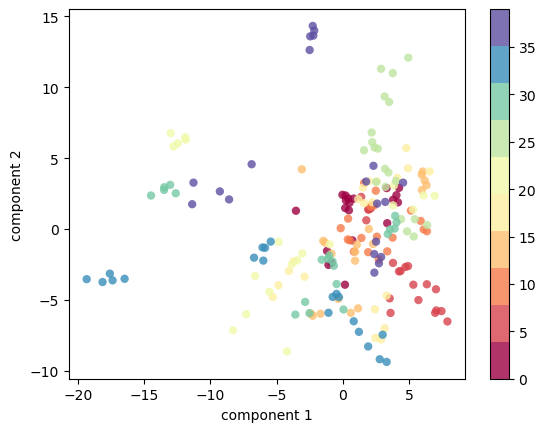

In [9]:
#visualized 2D representation of the faces in the dataset
plt.scatter(x_train_projected[:, 0], x_train_projected[:, 1], c=y_train, edgecolor='none', alpha=0.8, cmap=plt.cm.get_cmap('Spectral', 10))
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar();


Class 0: F-score = 0.9090909090909091
Class 1: F-score = 1.0
Class 2: F-score = 0.5714285714285715
Class 3: F-score = 0.7499999999999999
Class 4: F-score = 0.888888888888889
Class 5: F-score = 0.9090909090909091
Class 6: F-score = 0.888888888888889
Class 7: F-score = 0.888888888888889
Class 8: F-score = 1.0
Class 9: F-score = 0.7499999999999999
Class 10: F-score = 1.0
Class 11: F-score = 1.0
Class 12: F-score = 0.7272727272727272
Class 13: F-score = 1.0
Class 14: F-score = 0.9090909090909091
Class 15: F-score = 1.0
Class 16: F-score = 0.33333333333333337
Class 17: F-score = 0.9090909090909091
Class 18: F-score = 0.888888888888889
Class 19: F-score = 1.0
Class 20: F-score = 0.8333333333333333
Class 21: F-score = 0.888888888888889
Class 22: F-score = 0.625
Class 23: F-score = 1.0
Class 24: F-score = 0.9090909090909091
Class 25: F-score = 0.888888888888889
Class 26: F-score = 1.0
Class 27: F-score = 1.0
Class 28: F-score = 1.0
Class 29: F-score = 1.0
Class 30: F-score = 0.888888888888889


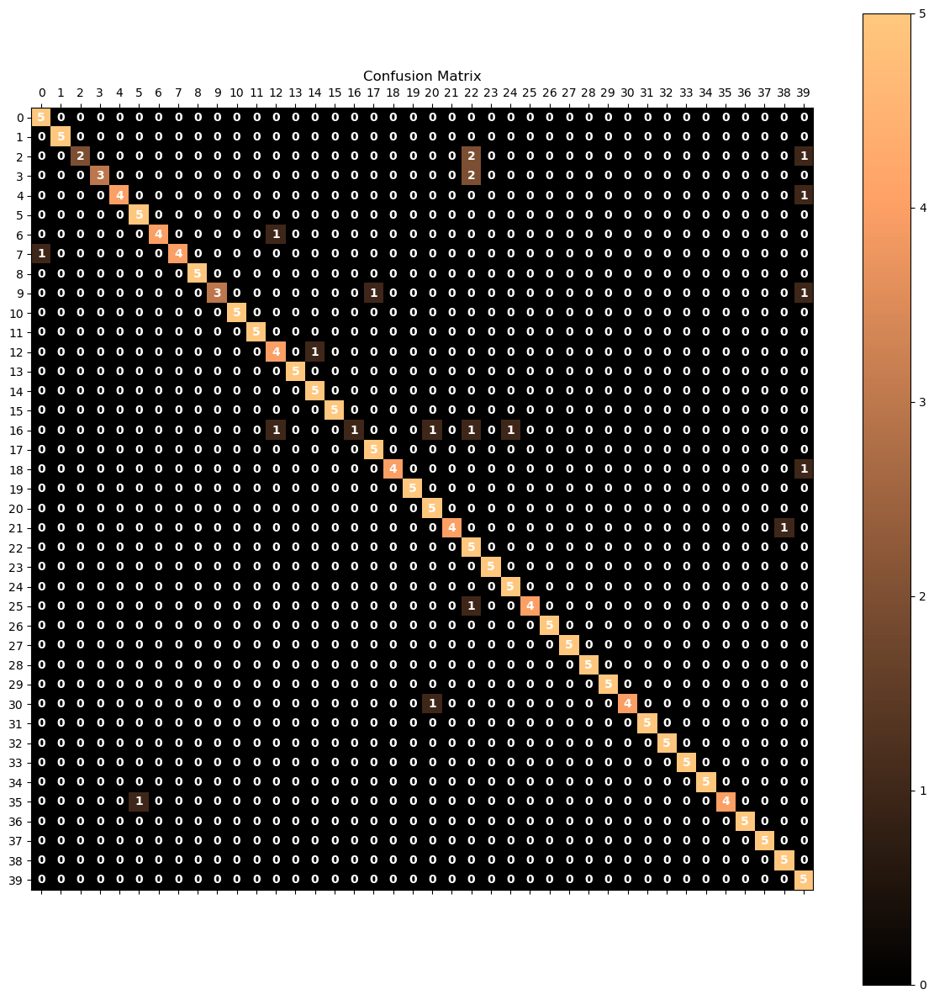

Displaying the most confused pairs:


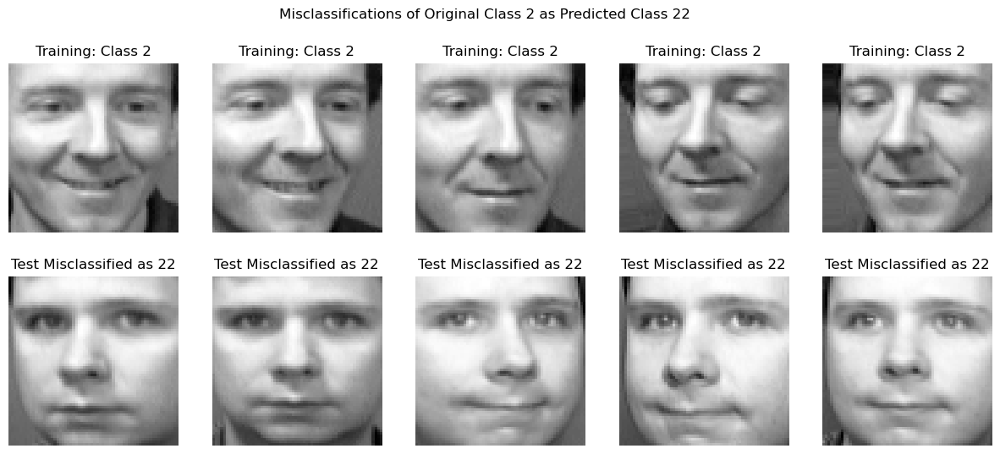

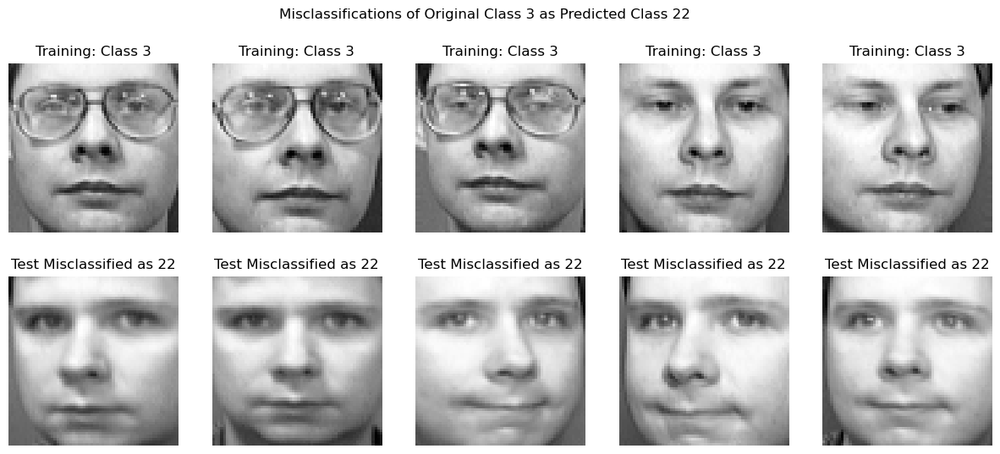

In [10]:
#calculate LDA F-score for each class
fscores_lda = []
for j in range(N_IDENTITIES):
    positives = np.sum(y_test == j)
    true_positives = np.sum((y_pred_lda == j) & (y_test == j))
    false_positives = np.sum((y_pred_lda == j) & (y_test != j))

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
    recall = true_positives / positives if positives > 0 else 0
    fscore = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    fscores_lda.append(fscore)
    print(f'Class {j}: F-score = {fscore}')

#calculate and print average F-score    
average_f_score_lda = np.mean(fscores_lda)
print(f'\nAverage F-score for LDA: {average_f_score_lda}')

#display confusion matrix
confusion_lda = confusion_matrix(y_test, y_pred_lda)
plot_confusion(confusion_lda)
show_confused_pairs(confusion_lda, y_test, y_pred_lda, x_train, y_train, x_test, img_height, img_width)


Class 0: F-score = 0.6666666666666666
Class 1: F-score = 1.0
Class 2: F-score = 0.5714285714285715
Class 3: F-score = 0.8000000000000002
Class 4: F-score = 0.888888888888889
Class 5: F-score = 1.0
Class 6: F-score = 1.0
Class 7: F-score = 0.8000000000000002
Class 8: F-score = 1.0
Class 9: F-score = 0.7499999999999999
Class 10: F-score = 1.0
Class 11: F-score = 1.0
Class 12: F-score = 0.6
Class 13: F-score = 1.0
Class 14: F-score = 1.0
Class 15: F-score = 1.0
Class 16: F-score = 0.33333333333333337
Class 17: F-score = 1.0
Class 18: F-score = 1.0
Class 19: F-score = 1.0
Class 20: F-score = 0.9090909090909091
Class 21: F-score = 0.888888888888889
Class 22: F-score = 0.8333333333333333
Class 23: F-score = 1.0
Class 24: F-score = 0.9090909090909091
Class 25: F-score = 0.7499999999999999
Class 26: F-score = 1.0
Class 27: F-score = 1.0
Class 28: F-score = 1.0
Class 29: F-score = 1.0
Class 30: F-score = 0.888888888888889
Class 31: F-score = 1.0
Class 32: F-score = 1.0
Class 33: F-score = 1.0
C

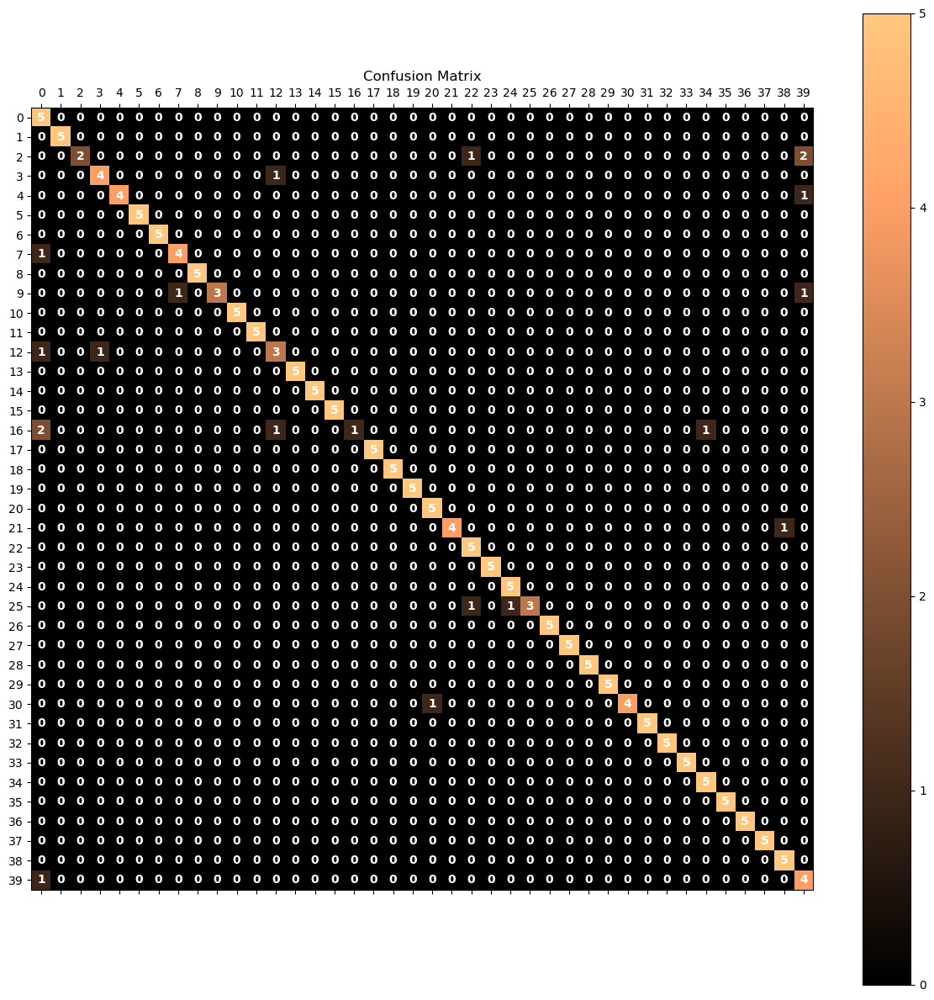

Displaying the most confused pairs:


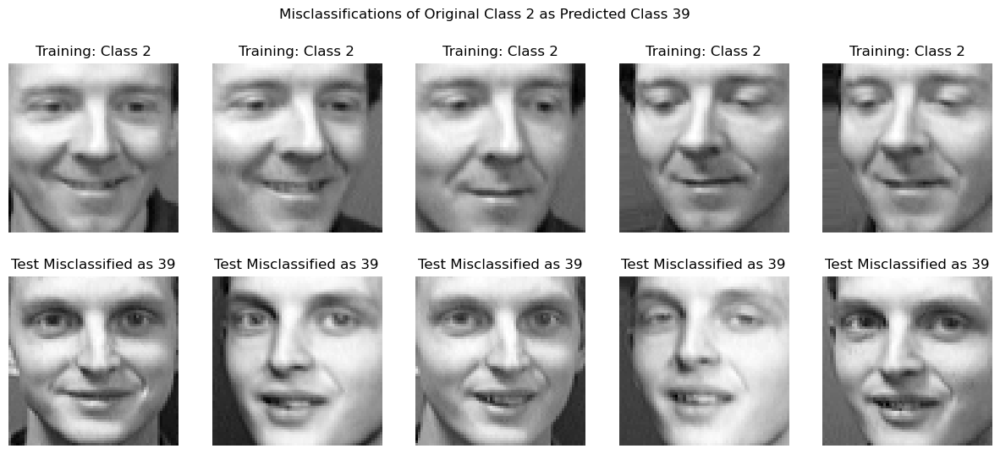

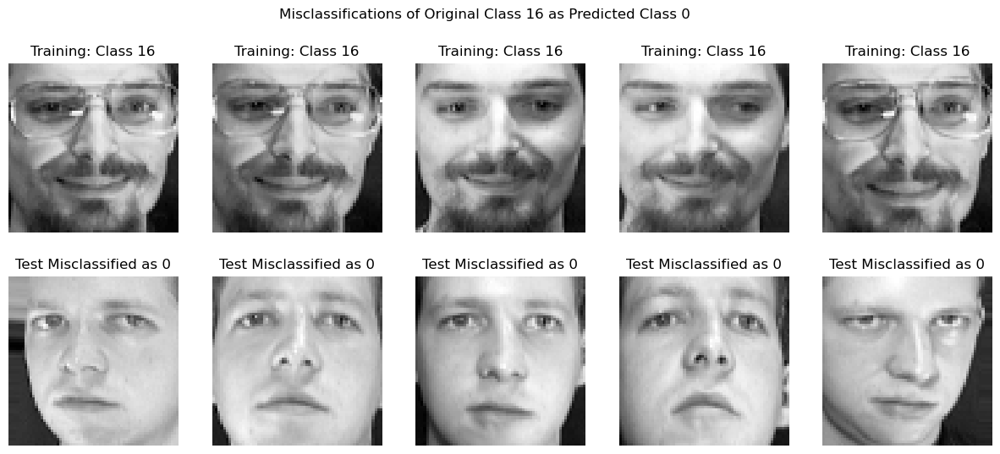

In [11]:
#calculate SVM F-score for each class
fscores_svm = []
for j in range(N_IDENTITIES):  
    positives = np.sum(y_test == j)
    true_positives = np.sum((y_pred_svm == j) & (y_test == j))
    false_positives = np.sum((y_pred_svm == j) & (y_test != j))

    precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
    recall = true_positives / positives if positives > 0 else 0
    fscore = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    fscores_svm.append(fscore)
    print(f'Class {j}: F-score = {fscore}')

#calculate and print average F-score
average_f_score_svm = np.mean(fscores_svm)
print(f'\nAverage F-score for SVM: {average_f_score_svm}')

#display confusion matrix
confusion_svm = confusion_matrix(y_test, y_pred_svm)
plot_confusion(confusion_svm)
show_confused_pairs(confusion_svm, y_test, y_pred_svm, x_train, y_train, x_test, img_height, img_width)


-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
           ________________________________________________________TRAINING________________________________________________________
-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-


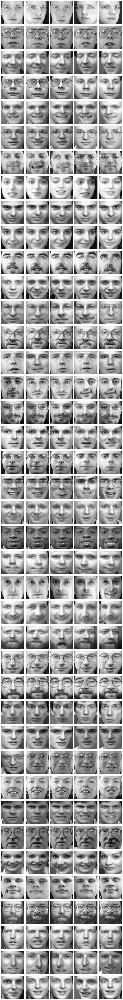






-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-
           ________________________________________________________TESTING________________________________________________________
-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-


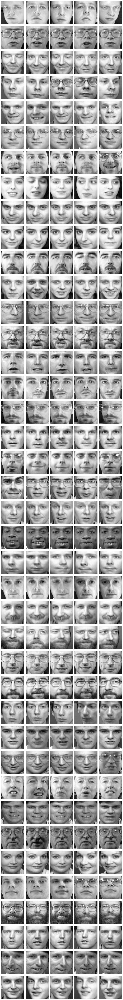

In [12]:
def show_images(imgs, img_height, img_width, num_cols):
    num_rows = (len(imgs) + num_cols - 1) // num_cols  
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 2, num_rows * 2))
    for index, ax in enumerate(axes.flatten()):
        if index < len(imgs):
            image = imgs[index].reshape(img_height, img_width)
            ax.imshow(image, cmap='gray')
            ax.axis('off')
        else:
            ax.axis('off') 
    plt.tight_layout()
    plt.show()

print('-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-')
print('           ________________________________________________________TRAINING________________________________________________________'           )
print('-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-')
show_images(x_train, img_height, img_width, TRAIN_IMAGES)
print('\n\n\n\n')
print('-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-')
print('           ________________________________________________________TESTING________________________________________________________'           )
print('-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-')
show_images(x_test, img_height, img_width, TEST_IMAGES)


In [13]:
#Reference:The methodologies and approaches implemented are based on frameworks and examples provided by Dr. Mauricio Pamplona Segundo.